Файл train_data.json --- датасет из наблюдений со следующими полями: 1.1. hash - идентификатор наблюдения; 1.2. targetAudience - параметры аудитории, а именно возраст, пол и доход (доход является комбинацией букв a, b, c, каждая из которых входит не более одного раза); 1.3. points - конкретный набор географических положений наружной рекламы и ее направления; 1.4. value - значение охвата аудитории

Задача - разработка модели, предсказывающей величину охвата по входным параметрам аудитории и точек, а также решения, которое на основе параметров подбирает лучший набор точек с точки зрения охвата.

На основе имеющихся пар аудитория-точки необходимо построить модель, которая будет прогнозировать охват наружной релкамы. На основе построенной модели необходимо построить систему предсказания наилучшего набора точек с точки зрения охвата при заданных ограничениях на аудиторию и количество точек. 

In [1]:
import pandas as pd
import numpy as np

import matplotlib.patheffects as path_effects
import os

import geojson
import geopandas as gpd

from scipy.cluster.vq import kmeans2, vq

from shapely.geometry import shape
from shapely import GeometryCollection, LineString, MultiPoint, Point, Polygon, minimum_bounding_radius, minimum_bounding_circle

import folium
from folium.plugins import HeatMap, Fullscreen

import pydeck as pdk
import matplotlib.pyplot as plt

import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def to_azimuth(point, dist, angle):
    lon = point.x * np.pi / 180
    lat = point.y * np.pi / 180
    angle = angle * np.pi / 180
    # angle = np.pi / 2.0 - angle
    angd = dist/6371000
    lat_r = np.arcsin(np.sin(lat) * np.cos(angd) + np.cos(lat) * np.sin(angd) * np.cos(angle))
    a = np.sin(angle) * np.sin(angd) * np.cos(lat)
    b = np.cos(angd) - np.sin(lat) * np.sin(lat_r)
    lon_r = lon + np.arctan2(a, b)
    return Point(np.degrees(lon_r), np.degrees(lat_r))

def to_poligon(point, azimuth):
    return Polygon([point, to_azimuth(point, 200, azimuth+15), to_azimuth(point, 200, azimuth-15)])

def prepare_df(df):
    df_temp = df.explode('points', ignore_index=True)
    df_temp = pd.concat([df_temp[['hash', 'value', 'points']], pd.json_normalize(df_temp['targetAudience'])], axis=1)
    points_temp = pd.json_normalize(df_temp['points'])
    df_temp['points'] = df_temp['points'].astype(str)
    points_temp.index = df_temp['points']

    points_temp = points_temp[~points_temp.index.duplicated(keep='first')]
    points_temp['place_coordinates'] = points_temp.apply(lambda x: Point(x.lon, x.lat), axis=1)
    points_temp['coordinates'] = points_temp.apply(lambda x: to_poligon(x.place_coordinates, x.azimuth), axis=1)

    return df_temp, points_temp

In [2]:
df = pd.read_json('content/train_data.json')
df, points = prepare_df(df)
print(len(df), len(points))

136839 11807


In [3]:
df.iloc[df.groupby("ageFrom").groups[18]]

,hash,value,points,name,gender,ageFrom,ageTo,income,id
331,8c7b4ce5c963e40f,0.21,"{'lat': '55.704338004448', 'lon': '37.63604342...",All 18+,male,18,25,abc,NaN
1222,b537b227b7f43701,0.01,"{'lat': '55.663223407389', 'lon': '37.51007616...",All 18+,all,18,100,abc,NaN
1223,b537b227b7f43701,0.01,"{'lat': '55.792799808556', 'lon': '37.61298716...",All 18+,all,18,100,abc,NaN
1224,b537b227b7f43701,0.01,"{'lat': '55.768937888277', 'lon': '37.51923322...",All 18+,all,18,100,abc,NaN
1709,e620e76b7db30861,96.19,"{'lat': '55.80179400952', 'lon': '37.750030096...",All 18+,all,18,100,abc,NaN
...,...,...,...,...,...,...,...,...,...
129716,2228ed2583f2b5ad,3.21,"{'lat': '55.77363277883', 'lon': '37.627318203...",All 18+,all,18,100,abc,NaN
129717,2228ed2583f2b5ad,3.21,"{'lat': '55.76524534092', 'lon': '37.654215322...",All 18+,all,18,100,abc,NaN
129718,2228ed2583f2b5ad,3.21,"{'lat': '55.742602628012', 'lon': '37.65448895...",All 18+,all,18,100,abc,NaN
129719,7b25b5ad375cfab4,2.06,"{'lat': '55.73747100137', 'lon': '37.590034962...",All 18+,all,18,100,abc,NaN


In [4]:
# campaigns =  


In [5]:
# Преобразуем координаты в метры, используя пулковскую проекцию epsg:2584
points_xy = gpd.GeoDataFrame(points).set_geometry('place_coordinates').set_crs(epsg=4326).to_crs(epsg=2584).geometry
points_xy = points_xy.map(lambda x: x.coords[0]).apply(pd.Series)
points_xy.columns = ['x', 'y']
points['x'] = points_xy['x']
points['y'] = points_xy['y']
points = points[['x', 'y', 'azimuth', 'place_coordinates', 'coordinates']]
del points_xy

In [6]:
points

,x,y,azimuth,place_coordinates,coordinates
points,,,,,
"{'lat': '55.573691', 'lon': '37.631423', 'azimuth': 273}",1.169330e+06,6.212676e+06,273,POINT (37.631423 55.573691),"POLYGON ((37.631423 55.573691, 37.628397178454..."
"{'lat': '55.584765', 'lon': '37.712454', 'azimuth': 232}",1.174218e+06,6.214690e+06,232,POINT (37.712454 55.584765),"POLYGON ((37.712454 55.584765, 37.709524647460..."
"{'lat': '55.808425457052', 'lon': '37.388807961811', 'azimuth': 188}",1.150188e+06,6.236323e+06,188,POINT (37.388807961811 55.808425457052),"POLYGON ((37.388807961811 55.808425457052, 37...."
"{'lat': '55.674378', 'lon': '37.422364', 'azimuth': 333}",1.154534e+06,6.221809e+06,333,POINT (37.422364 55.674378),"POLYGON ((37.422364 55.674378, 37.421700799413..."
"{'lat': '55.608396', 'lon': '37.766383', 'azimuth': 54}",1.177186e+06,6.217833e+06,54,POINT (37.766383 55.608396),"POLYGON ((37.766383 55.608396, 37.769355855319..."
...,...,...,...,...,...
"{'lat': '55.694606888975', 'lon': '37.676855921745', 'azimuth': 93}",1.170096e+06,6.226493e+06,93,POINT (37.676855921745 55.694606888975),"POLYGON ((37.676855921745 55.694606888975, 37...."
"{'lat': '55.776880761572', 'lon': '37.524088025093', 'azimuth': 40}",1.159153e+06,6.234120e+06,40,POINT (37.524088025093 55.776880761572),"POLYGON ((37.524088025093 55.776880761572, 37...."
"{'lat': '55.623283257711', 'lon': '37.421858310699', 'azimuth': 324}",1.155361e+06,6.216150e+06,324,POINT (37.421858310699 55.623283257711),"POLYGON ((37.421858310699 55.623283257711, 37...."


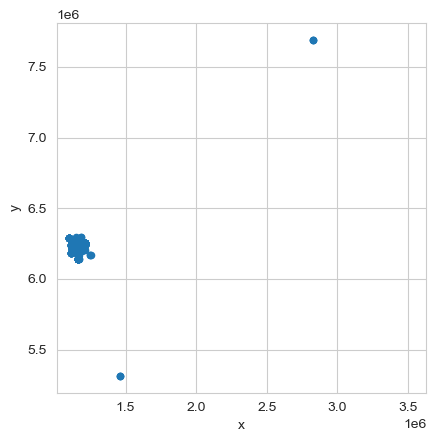

In [7]:
df_xy = pd.merge(df, points, left_on='points', right_index=True)[['points', 'x', 'y']]
ax = df_xy.plot.scatter('x', 'y').axis("square")

^ в верхнем правом углу Сургут, внизу - Ростов-На-Дону

In [8]:
# Возьмем центроид и отсечем лишнее (>100 км от центроида)
x, y = df_xy.x.mean(), df_xy.y.mean()
df_xy['r'] = np.sqrt((df_xy.x-x)*(df_xy.x-x)+(df_xy.y-y)*(df_xy.y-y))
df_xy.r.astype(int).nlargest(10)

65934     2211472
65936     2211472
65938     2211472
30707      964960
30704      964928
30705      964883
21011      108365
21009      104987
21008      104360
119211      93357
Name: r, dtype: int32

In [9]:
df = df[df_xy.r <=100000]
df

,hash,value,points,name,gender,ageFrom,ageTo,income,id
0,41567f28db47bee7,23.51,"{'lat': '55.573691', 'lon': '37.631423', 'azim...",All 25-45 BC,all,25,45,bc,NaN
1,41567f28db47bee7,23.51,"{'lat': '55.584765', 'lon': '37.712454', 'azim...",All 25-45 BC,all,25,45,bc,NaN
2,41567f28db47bee7,23.51,"{'lat': '55.808425457052', 'lon': '37.38880796...",All 25-45 BC,all,25,45,bc,NaN
3,41567f28db47bee7,23.51,"{'lat': '55.674378', 'lon': '37.422364', 'azim...",All 25-45 BC,all,25,45,bc,NaN
4,41567f28db47bee7,23.51,"{'lat': '55.608396', 'lon': '37.766383', 'azim...",All 25-45 BC,all,25,45,bc,NaN
...,...,...,...,...,...,...,...,...,...
136834,464e9e7d315ba25d,52.66,"{'lat': '55.907413', 'lon': '37.53523', 'azimu...",M 25-55,male,25,55,abc,NaN
136835,464e9e7d315ba25d,52.66,"{'lat': '55.871245', 'lon': '37.410527', 'azim...",M 25-55,male,25,55,abc,NaN
136836,464e9e7d315ba25d,52.66,"{'lat': '55.585678', 'lon': '37.715744', 'azim...",M 25-55,male,25,55,abc,NaN
136837,464e9e7d315ba25d,52.66,"{'lat': '55.74793358781934', 'lon': '37.536522...",M 25-55,male,25,55,abc,NaN


In [10]:
points = points.iloc[points.index.isin(set(df.points))]
points

,x,y,azimuth,place_coordinates,coordinates
points,,,,,
"{'lat': '55.573691', 'lon': '37.631423', 'azimuth': 273}",1.169330e+06,6.212676e+06,273,POINT (37.631423 55.573691),"POLYGON ((37.631423 55.573691, 37.628397178454..."
"{'lat': '55.584765', 'lon': '37.712454', 'azimuth': 232}",1.174218e+06,6.214690e+06,232,POINT (37.712454 55.584765),"POLYGON ((37.712454 55.584765, 37.709524647460..."
"{'lat': '55.808425457052', 'lon': '37.388807961811', 'azimuth': 188}",1.150188e+06,6.236323e+06,188,POINT (37.388807961811 55.808425457052),"POLYGON ((37.388807961811 55.808425457052, 37...."
"{'lat': '55.674378', 'lon': '37.422364', 'azimuth': 333}",1.154534e+06,6.221809e+06,333,POINT (37.422364 55.674378),"POLYGON ((37.422364 55.674378, 37.421700799413..."
"{'lat': '55.608396', 'lon': '37.766383', 'azimuth': 54}",1.177186e+06,6.217833e+06,54,POINT (37.766383 55.608396),"POLYGON ((37.766383 55.608396, 37.769355855319..."
...,...,...,...,...,...
"{'lat': '55.694606888975', 'lon': '37.676855921745', 'azimuth': 93}",1.170096e+06,6.226493e+06,93,POINT (37.676855921745 55.694606888975),"POLYGON ((37.676855921745 55.694606888975, 37...."
"{'lat': '55.776880761572', 'lon': '37.524088025093', 'azimuth': 40}",1.159153e+06,6.234120e+06,40,POINT (37.524088025093 55.776880761572),"POLYGON ((37.524088025093 55.776880761572, 37...."
"{'lat': '55.623283257711', 'lon': '37.421858310699', 'azimuth': 324}",1.155361e+06,6.216150e+06,324,POINT (37.421858310699 55.623283257711),"POLYGON ((37.421858310699 55.623283257711, 37...."


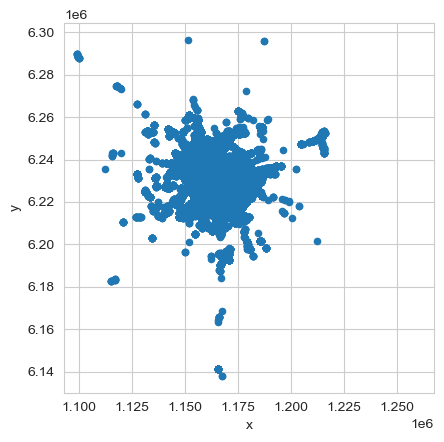

In [11]:
df_xy = df_xy[df_xy.r <=100000]
ax = df_xy.plot.scatter('x', 'y').axis("square")

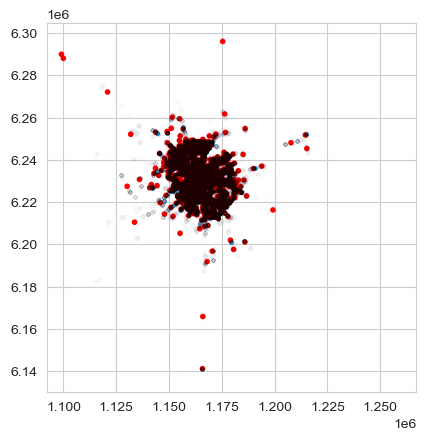

Кластеров: 986
Среднее расстояние: 255.1


In [12]:
# Кластеризация

z = list(zip(df_xy.x,df_xy.y))

n_clusters = 1000
centroids, label = kmeans2(z, n_clusters, minit='points')

plt.plot(df_xy.x, df_xy.y, '.', alpha=0.005)
for i, center in enumerate(centroids):
    circle1 = plt.Circle(center, 1000, fill=True, linewidth=1, color='r', label=i)
    plt.gca().add_patch(circle1)
plt.axis("square")
# plt.legend(shadow=True, loc='upper left', bbox_to_anchor=(1.05, 1))
plt.show()

clusters, dist = vq(z, centroids)
print(f"Кластеров: {len(set(clusters))}\nСреднее расстояние: {dist.mean():.1f}")

In [13]:
len(clusters)

136830

<Figure size 2000x2000 with 0 Axes>

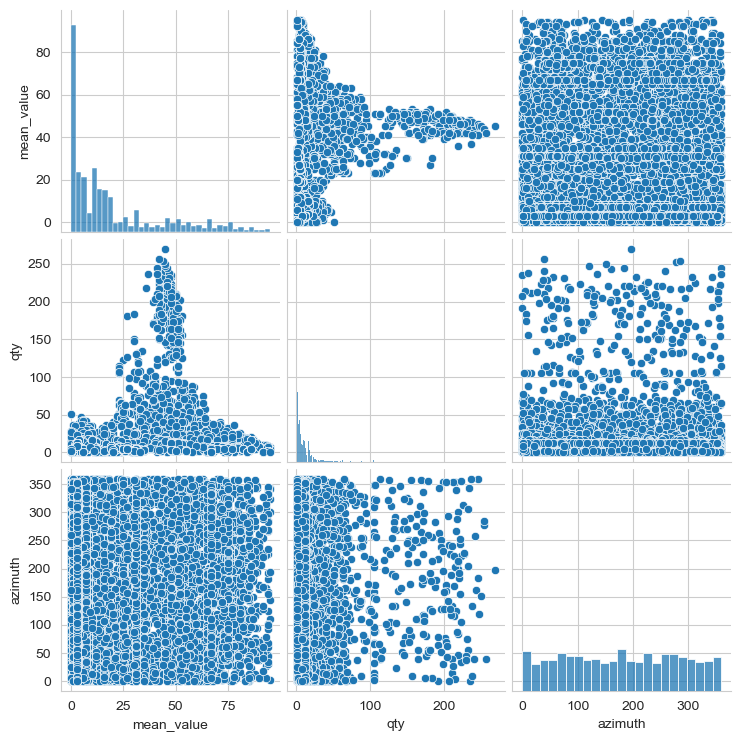

In [14]:
points["mean_value"] = df.groupby("points")["value"].mean().astype(int)
points["qty"] = df.groupby("points")["value"].count()

plt.figure(figsize=(20, 20))
ax = sns.pairplot(points[['mean_value', 'qty', 'azimuth']])

In [16]:
m = folium.Map(location=(55.755826, 37.6173), zoom_start=9, attributionControl=0)
folium.TileLayer('CartoDB positron', name = 'CartoDB positron').add_to(m)
folium.TileLayer('stamenterrain', name = 'Без подложки').add_to(m)
folium.TileLayer('https://mt0.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
                 attr = 'Google Satellite', name = 'Google Спутник').add_to(m)
folium.TileLayer('http://mt0.google.com/vt/lyrs=y&hl=ru&x={x}&y={y}&z={z}',
                 attr = 'Google Hybrid', name = 'Google Гибрид').add_to(m)
folium.TileLayer('https://mt0.google.com/vt/lyrs=m&hl=ru&x={x}&y={y}&z={z}',
                 attr = 'Google Roadmap', name = 'Google Схема').add_to(m)

fg = folium.FeatureGroup(name='>1 кампании', show=True)
m.add_child(fg)
gdf_points = gpd.GeoDataFrame(points[points['qty']>1][['mean_value', 'qty', 'coordinates']])
gdf_points.set_geometry('coordinates', inplace=True)
gdf_points.set_crs(epsg=4326, inplace=True)
gdf_points['color'] = gdf_points.mean_value.map(lambda x : np.log10(x+1)/np.log10(100))
gdf_points.explore(column='color', cmap='winter', m=fg, legend=False) # RdYlGn

fg = folium.FeatureGroup(name='Успешные кампании', show=False)
m.add_child(fg)
gdf_points = gpd.GeoDataFrame(points[points['mean_value']>30][['mean_value', 'qty', 'coordinates']])
gdf_points.set_geometry('coordinates', inplace=True)
gdf_points.set_crs(epsg=4326, inplace=True)
gdf_points['color'] = gdf_points.mean_value.map(lambda x : 'red' if x<=10 else 'blue' if x<30 else 'green')
gdf_points.explore(column='color', cmap=['green'], m=fg, legend=False)

fg = folium.FeatureGroup(name='Кампании 18+', show=False)
m.add_child(fg)
gdf_points = gpd.GeoDataFrame(points[points.index.isin(set(df.points.iloc[df.groupby("ageFrom").groups[18]]))][['mean_value', 'qty', 'coordinates']])
gdf_points.set_geometry('coordinates', inplace=True)
gdf_points.set_crs(epsg=4326, inplace=True)

gdf_points['color'] = gdf_points.mean_value.map(lambda x : 'red' if x<=10 else 'blue' if x<30 else 'green')
gdf_points.explore(column='color', cmap=['blue', 'green', 'red'], m=fg, legend=False)

fg = folium.FeatureGroup(name='Кампании 24+', show=False)
m.add_child(fg)
gdf_points = gpd.GeoDataFrame(points[points.index.isin(set(df.points.iloc[df.groupby("ageFrom").groups[24]]))][['mean_value', 'qty', 'coordinates']])
gdf_points.set_geometry('coordinates', inplace=True)
gdf_points.set_crs(epsg=4326, inplace=True)

gdf_points['color'] = gdf_points.mean_value.map(lambda x : 'red' if x<=10 else 'blue' if x<30 else 'green')
gdf_points.explore(column='color', cmap=['blue', 'green', 'red'], m=fg, legend=False)

m.add_child(folium.LayerControl())

# ML

In [25]:
def create_dataset(centroids, df_xy):
    z = list(zip(df_xy.x,df_xy.y))
    clusters, dist = vq(z, centroids)
    return clusters, dist


In [26]:
def create_config(df_xy, n_clusters=500):
    z = list(zip(df_xy.x,df_xy.y))
    centroids, label = kmeans2(z, n_clusters, minit='points')
    return centroids

config = create_config(df_xy, 100)

In [27]:
dataset = pd.DataFrame(create_dataset(config, df))

AttributeError: 'DataFrame' object has no attribute 'x'

# Загружаем данные

In [21]:
df = pd.read_json('content/train_data.json')
df, points = prepare_df(df)
print(len(df), len(points))
# Преобразуем координаты в метры, используя пулковскую проекцию epsg:2584
points_xy = gpd.GeoDataFrame(points).set_geometry('place_coordinates').set_crs(epsg=4326).to_crs(epsg=2584).geometry
points_xy = points_xy.map(lambda x: x.coords[0]).apply(pd.Series)
points_xy.columns = ['x', 'y']
points['x'] = points_xy['x']
points['y'] = points_xy['y']
points = points[['x', 'y', 'azimuth', 'place_coordinates', 'coordinates']]
del points_xy
# отсечем лишнее (>100 км от центроида)
df_xy = pd.merge(df, points, left_on='points', right_index=True)[['points', 'x', 'y']]
x, y = df_xy.x.mean(), df_xy.y.mean()
df_xy['r'] = np.sqrt((df_xy.x-x)*(df_xy.x-x)+(df_xy.y-y)*(df_xy.y-y))
df = df[df_xy.r <=100000]

points = points.iloc[points.index.isin(set(df.points))]
df_xy = df_xy[df_xy.r <=100000]

136839 11807


In [23]:
df_xy

,points,x,y,r
0,"{'lat': '55.573691', 'lon': '37.631423', 'azimuth': 273}",1.169330e+06,6.212676e+06,19171.186477
1,"{'lat': '55.584765', 'lon': '37.712454', 'azimuth': 232}",1.174218e+06,6.214690e+06,19141.349376
2,"{'lat': '55.808425457052', 'lon': '37.388807961811', 'azimuth': 188}",1.150188e+06,6.236323e+06,15315.431375
3,"{'lat': '55.674378', 'lon': '37.422364', 'azimuth': 333}",1.154534e+06,6.221809e+06,13843.905947
4,"{'lat': '55.608396', 'lon': '37.766383', 'azimuth': 54}",1.177186e+06,6.217833e+06,18377.863737
...,...,...,...,...
136834,"{'lat': '55.907413', 'lon': '37.53523', 'azimuth': 259}",1.157626e+06,6.248668e+06,18764.058927
136835,"{'lat': '55.871245', 'lon': '37.410527', 'azimuth': 231}",1.150485e+06,6.243479e+06,18699.519102
136836,"{'lat': '55.585678', 'lon': '37.715744', 'azimuth': 56}",1.174408e+06,6.214823e+06,19122.644982
136837,"{'lat': '55.74793358781934', 'lon': '37.53652274608613', 'azimuth': 224}",1.160421e+06,6.231037e+06,4229.310231


In [22]:
df

,hash,value,points,name,gender,ageFrom,ageTo,income,id
0,41567f28db47bee7,23.51,"{'lat': '55.573691', 'lon': '37.631423', 'azimuth': 273}",All 25-45 BC,all,25,45,bc,NaN
1,41567f28db47bee7,23.51,"{'lat': '55.584765', 'lon': '37.712454', 'azimuth': 232}",All 25-45 BC,all,25,45,bc,NaN
2,41567f28db47bee7,23.51,"{'lat': '55.808425457052', 'lon': '37.388807961811', 'azimuth': 188}",All 25-45 BC,all,25,45,bc,NaN
3,41567f28db47bee7,23.51,"{'lat': '55.674378', 'lon': '37.422364', 'azimuth': 333}",All 25-45 BC,all,25,45,bc,NaN
4,41567f28db47bee7,23.51,"{'lat': '55.608396', 'lon': '37.766383', 'azimuth': 54}",All 25-45 BC,all,25,45,bc,NaN
...,...,...,...,...,...,...,...,...,...
136834,464e9e7d315ba25d,52.66,"{'lat': '55.907413', 'lon': '37.53523', 'azimuth': 259}",M 25-55,male,25,55,abc,NaN
136835,464e9e7d315ba25d,52.66,"{'lat': '55.871245', 'lon': '37.410527', 'azimuth': 231}",M 25-55,male,25,55,abc,NaN
136836,464e9e7d315ba25d,52.66,"{'lat': '55.585678', 'lon': '37.715744', 'azimuth': 56}",M 25-55,male,25,55,abc,NaN
136837,464e9e7d315ba25d,52.66,"{'lat': '55.74793358781934', 'lon': '37.53652274608613', 'azimuth': 224}",M 25-55,male,25,55,abc,NaN


In [28]:
config = create_config(df_xy, 100)

In [29]:
config

array([[1159919.61572164, 6231397.2922041 ],
       [1174397.85462429, 6230954.94262081],
       [1157765.45526997, 6228905.7958927 ],
       [1162817.74949224, 6230837.2333172 ],
       [1159030.70702411, 6220964.53455605],
       [1146160.45574055, 6242380.50656529],
       [1163857.83812309, 6230165.38306809],
       [1170585.77648636, 6218169.92318345],
       [1165425.55811586, 6237592.73988515],
       [1167063.6708988 , 6223804.53046132],
       [1168745.78063988, 6227291.02798911],
       [1180958.51987012, 6236218.18682635],
       [1161981.35084047, 6231556.05513777],
       [1174994.10572006, 6218679.59843984],
       [1158878.62130582, 6236734.37894966],
       [1165780.55351815, 6230884.92880762],
       [1148096.52467422, 6218056.14019802],
       [1163779.62048195, 6232070.60028914],
       [1160766.8502993 , 6223798.78830802],
       [1168449.69979922, 6236150.08244096],
       [1169643.64697288, 6228262.15623748],
       [1159849.75752913, 6216621.72184416],
       [11

In [33]:
label, dist = create_dataset(config, df_xy)

In [34]:
df_xy['label'] = label

In [ ]:
df_xy['dist'] = dist

In [35]:
df_xy

,points,x,y,r,label
0,"{'lat': '55.573691', 'lon': '37.631423', 'azimuth': 273}",1.169330e+06,6.212676e+06,19171.186477,70
1,"{'lat': '55.584765', 'lon': '37.712454', 'azimuth': 232}",1.174218e+06,6.214690e+06,19141.349376,56
2,"{'lat': '55.808425457052', 'lon': '37.388807961811', 'azimuth': 188}",1.150188e+06,6.236323e+06,15315.431375,41
3,"{'lat': '55.674378', 'lon': '37.422364', 'azimuth': 333}",1.154534e+06,6.221809e+06,13843.905947,59
4,"{'lat': '55.608396', 'lon': '37.766383', 'azimuth': 54}",1.177186e+06,6.217833e+06,18377.863737,13
...,...,...,...,...,...
136834,"{'lat': '55.907413', 'lon': '37.53523', 'azimuth': 259}",1.157626e+06,6.248668e+06,18764.058927,69
136835,"{'lat': '55.871245', 'lon': '37.410527', 'azimuth': 231}",1.150485e+06,6.243479e+06,18699.519102,50
136836,"{'lat': '55.585678', 'lon': '37.715744', 'azimuth': 56}",1.174408e+06,6.214823e+06,19122.644982,56
136837,"{'lat': '55.74793358781934', 'lon': '37.53652274608613', 'azimuth': 224}",1.160421e+06,6.231037e+06,4229.310231,0


## Создание модели

In [37]:
from catboost import CatBoostRegressor, Pool
from sklearn.model_selection import train_test_split

In [41]:
X = df_xy[['x','y','r']]
y = df['value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
model = CatBoostRegressor(iterations=1000,
                          depth=6,
                          learning_rate=0.5,
                          loss_function='RMSE')

model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=100)

0:	learn: 29.2209275	test: 29.2584955	best: 29.2584955 (0)	total: 177ms	remaining: 2m 57s
100:	learn: 25.5340557	test: 25.7918446	best: 25.7918446 (100)	total: 2s	remaining: 17.8s
200:	learn: 24.1640167	test: 24.5590578	best: 24.5590578 (200)	total: 3.46s	remaining: 13.8s
300:	learn: 23.2836832	test: 23.7869104	best: 23.7869104 (300)	total: 4.73s	remaining: 11s
400:	learn: 22.7504073	test: 23.2932160	best: 23.2932160 (400)	total: 5.99s	remaining: 8.94s
500:	learn: 22.3775850	test: 22.9616034	best: 22.9616034 (500)	total: 7.36s	remaining: 7.33s
600:	learn: 22.0755954	test: 22.6836737	best: 22.6836737 (600)	total: 8.64s	remaining: 5.74s
700:	learn: 21.8460948	test: 22.4994015	best: 22.4994015 (700)	total: 9.95s	remaining: 4.25s
800:	learn: 21.6701151	test: 22.3558221	best: 22.3558221 (800)	total: 11.3s	remaining: 2.8s
900:	learn: 21.5368594	test: 22.2370582	best: 22.2370582 (900)	total: 12.8s	remaining: 1.41s
999:	learn: 21.4197556	test: 22.1401729	best: 22.1401729 (999)	total: 14.1s	rem

In [43]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [44]:
y_pred = model.predict(X_test)

rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f'RMSE: {rmse:.4f}')
print(f'R²: {r2:.4f}')
print(f'MAE: {mae:.4f}')

RMSE: 22.1402
R²: 0.4400
MAE: 17.2383


In [ ]:
RMSE: 8.8370
R²: 0.8405
MAE: 5.6465

# Тестирование